In [ ]:
import albumentations as A        # For data augmentation
import cv2                        # For loading images
import matplotlib.pyplot as plt   # For plotting images
import numpy as np
import random

## Read Image

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
def visualize(image):
    plt.figure(figsize=(10, 10))
    plt.axis('off')
    plt.imshow(image)

In [ ]:
image = cv2.imread('/content/drive/MyDrive/Colab_Notebooks/Computer Vision/Augmentation/input/test.jpeg')  # BGR


In [ ]:
print(image.shape)

(267, 512, 3)


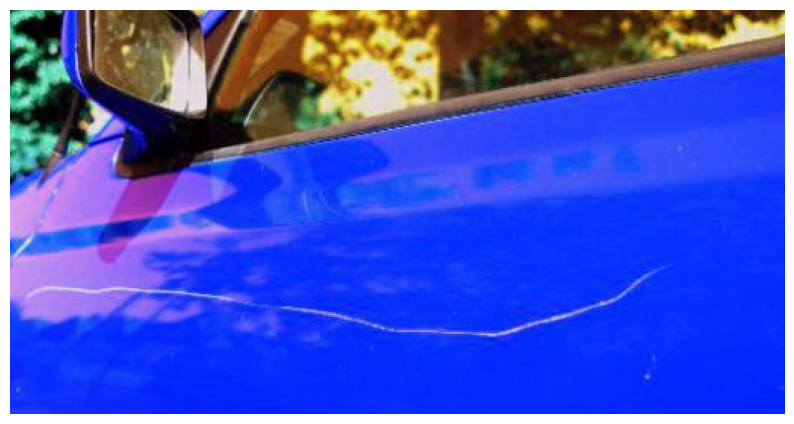

In [ ]:
# cv2_imshow(image)
visualize(image)

In [ ]:
# converting BGR to RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

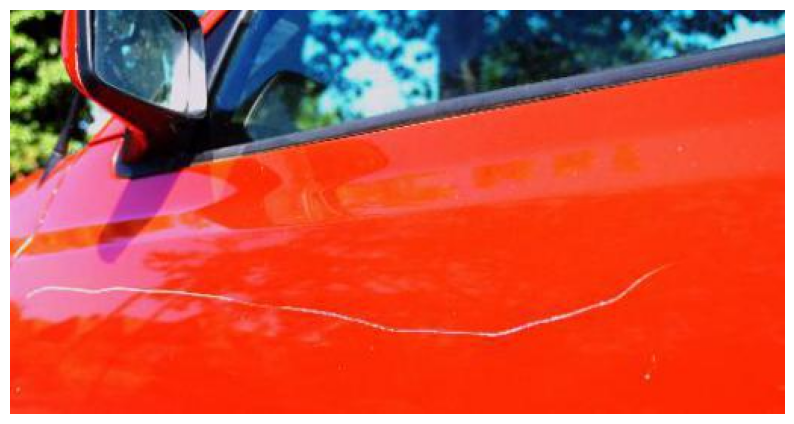

In [ ]:
visualize(image)

OpenCV provides us several interpolation methods for resizing an image.


Choice of Interpolation Method for Resizing:

1. cv2.INTER_AREA: This is used when we need to shrink an image.

2. cv2.INTER_CUBIC: This is slow but more efficient.

3. cv2.INTER_LINEAR: This is primarily used when zooming is required. This is the default interpolation technique in OpenCV.

In [ ]:
width = 512
height = 512
dim = (width, height)
  
# resize image
resized = cv2.resize(image, dim, interpolation = cv2.INTER_CUBIC)

Resized Dimensions :  (512, 512, 3)


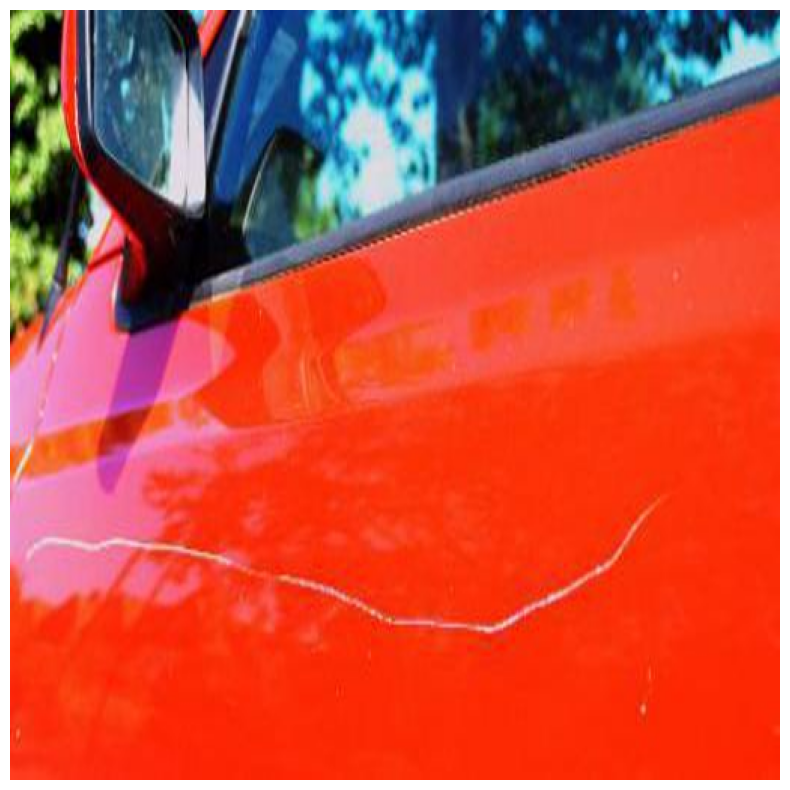

In [ ]:
print('Resized Dimensions : ',resized.shape)
 
visualize(resized)

# Refer

[Albumentation](https://albumentations.ai/docs/getting_started/image_augmentation/)

In [ ]:
print(A.__version__)

1.2.1


# Transforms 

1.   [CROP](https://albumentations.ai/docs/api_reference/augmentations/crops/transforms/#albumentations.augmentations.crops.transforms.Crop)
2.   [Resize](https://albumentations.ai/docs/api_reference/full_reference/#albumentations.augmentations.geometric.resize.Resize)
3.  [Flip](https://albumentations.ai/docs/api_reference/full_reference/#albumentations.augmentations.geometric.transforms.Flip)
4.  [VerticalFlip](https://albumentations.ai/docs/api_reference/full_reference/#albumentations.augmentations.geometric.transforms.VerticalFlip)
5.  [HorizontalFlip](https://albumentations.ai/docs/api_reference/full_reference/#albumentations.augmentations.geometric.transforms.HorizontalFlip)
6.  [Transpose](https://albumentations.ai/docs/api_reference/full_reference/#albumentations.augmentations.geometric.transforms.Transpose)
7.  [Rotate](https://albumentations.ai/docs/api_reference/full_reference/#albumentations.augmentations.geometric.rotate.Rotate)
8.  [Scale](https://albumentations.ai/docs/api_reference/full_reference/#albumentations.augmentations.geometric.resize.RandomScale)
9.  [RGB_SHIFT](https://albumentations.ai/docs/api_reference/full_reference/#albumentations.augmentations.transforms.RGBShift)
10. [BLUR](https://albumentations.ai/docs/api_reference/full_reference/#albumentations.augmentations.blur.transforms.Blur)
11. [CLAHE](https://albumentations.ai/docs/api_reference/full_reference/#albumentations.augmentations.transforms.CLAHE)
12. [ColorJitter](https://albumentations.ai/docs/api_reference/full_reference/#albumentations.augmentations.transforms.ColorJitter)
13. [Downscale](https://albumentations.ai/docs/api_reference/full_reference/#albumentations.augmentations.transforms.Downscale)
14. [ShiftScaleRotate](https://albumentations.ai/docs/api_reference/full_reference/#albumentations.augmentations.geometric.transforms.ShiftScaleRotate)
15. [GaussNoise](https://albumentations.ai/docs/api_reference/augmentations/transforms/)
16. [RandomBrightnessContrast](https://albumentations.ai/docs/api_reference/full_reference/#albumentations.augmentations.transforms.RandomBrightnessContrast)



In [ ]:
from matplotlib import pyplot as plt
%matplotlib inline

In [ ]:
transform = A.Compose(
    [
        A.Resize(height = 1080, width = 1080, interpolation = 3),
     
        # Choose one of the several augmentation
        A.OneOf([
            A.RandomCrop (height = 512, width = 512, always_apply=False, p=0.5),
            A.CenterCrop (height = 256, width = 256, always_apply=False, p=0.5) 
        ],p = 0.1),
        
        A.Rotate (limit= 90, interpolation=1, border_mode=4, value=None, mask_value=None, crop_border=False, always_apply=False, p=0.5),
        A.Flip(p = 0.5),
        A.RGBShift (r_shift_limit=20, g_shift_limit=20, b_shift_limit=20, always_apply=False, p=0.5),
     
        # Choose one of the several augmentation
        A.OneOf([
            A.Blur (blur_limit=7, always_apply=False, p=0.5),
            A.GaussianBlur (blur_limit=(3, 7), sigma_limit=0, always_apply=False, p=0.5),
            A.GlassBlur (sigma=0.7, max_delta=4, iterations=2, always_apply=False, mode='fast', p=0.5)
        ], p = 1.0),
     
        # Contrast Limited Adaptive Histogram Equalization
        A.CLAHE (clip_limit=4.0, tile_grid_size=(8, 8), always_apply=False, p=0.5),
     
        A.ColorJitter (brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2, always_apply=False, p=0.5),
        A.Downscale (scale_min=0.25, scale_max=0.25, interpolation=None, always_apply=False, p=0.5), 
        A.RandomScale (scale_limit=0.1, interpolation=1, always_apply=False, p=0.5),
        A.GaussNoise (var_limit=(10.0, 50.0), mean=0, per_channel=True, always_apply=False, p=0.5),
        A.ShiftScaleRotate (shift_limit=0.0625, scale_limit=0.1, rotate_limit=45, interpolation=1, border_mode=4, value=None, mask_value=None, shift_limit_x=None, shift_limit_y=None, rotate_method='largest_box', always_apply=False, p=0.5)

    ]
)



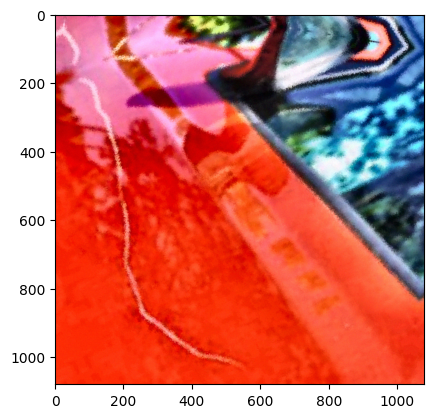

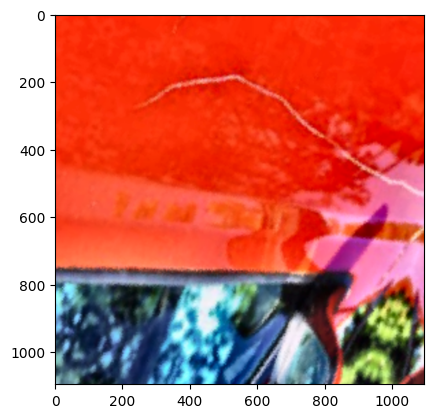

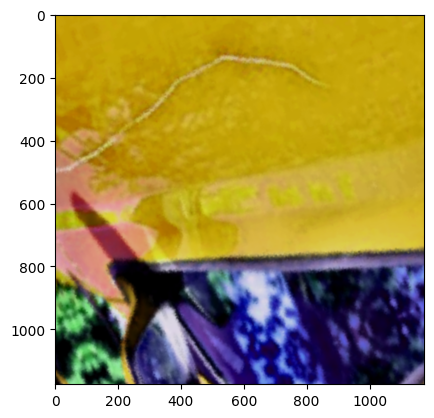

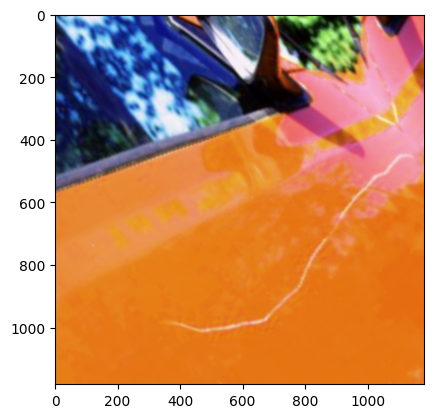

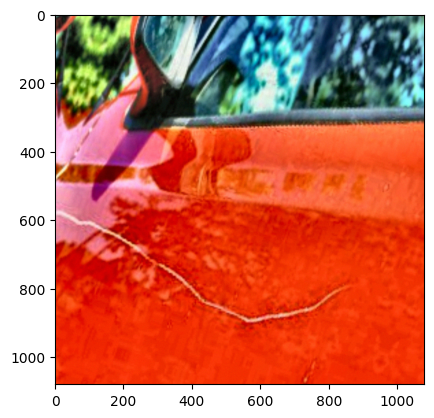

...

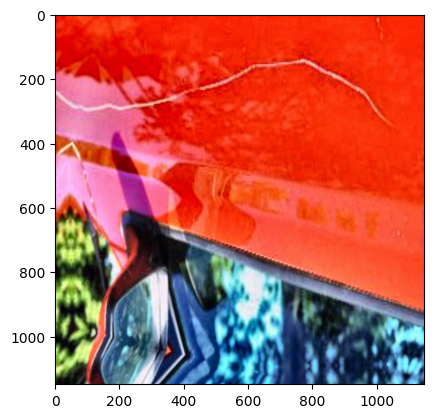

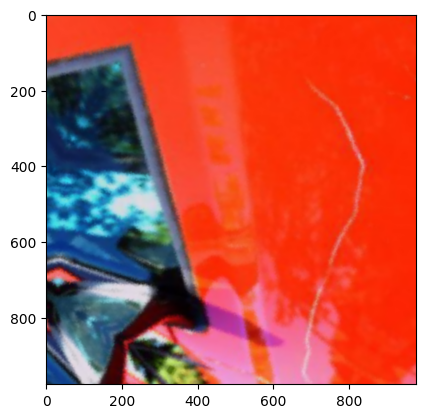

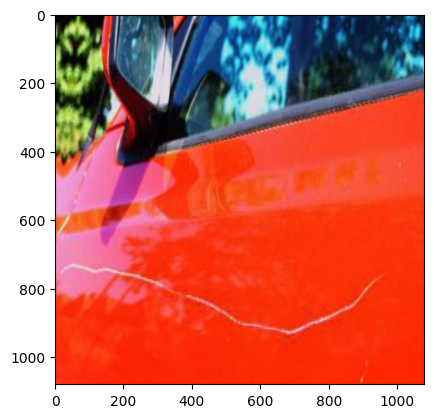

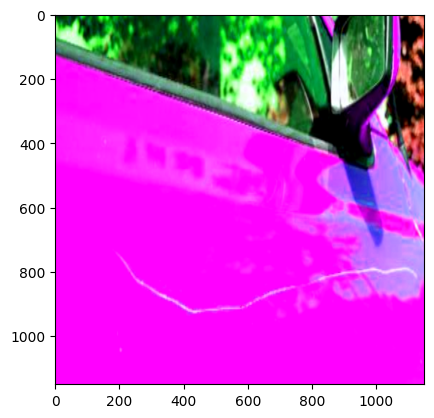

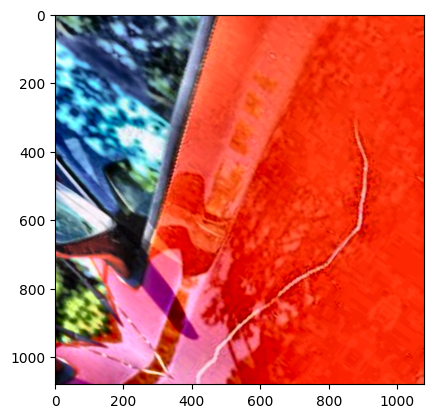

In [ ]:
# images_list = [image]
image_np = cv2.imread('/content/drive/MyDrive/Colab_Notebooks/Computer Vision/Augmentation/input/test.jpeg')  # BGR
# converting BGR to RGB
image_np = cv2.cvtColor(image_np, cv2.COLOR_BGR2RGB)
image_np = np.array(image_np)

# get 30 transformation
for i in range(30):
  augmentation = transform(image = image_np)
  augmented_img = augmentation["image"]
  # images_list.append(augmented_img)
  plt.imshow(augmented_img)
  plt.show()